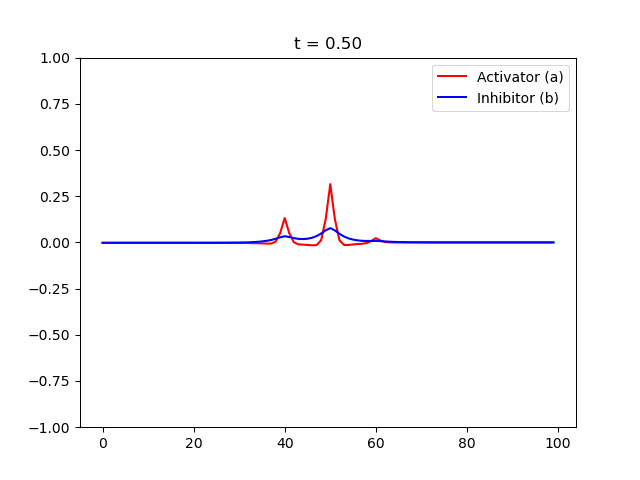

In [4]:
# Model 5: Interpeak Growth Attempt
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation, PillowWriter
from IPython.display import Image

class BaseStateSystem:
    pass

def laplacian1D(data, dx):
    lap = np.zeros_like(data)
    lap[1:-1] = (data[2:] - 2*data[1:-1] + data[:-2]) / (dx**2)
    return lap


def central_apical_initialiser(shape):
    a = np.zeros(shape)
    b = np.zeros(shape)
    center = shape // 2
    left = center - 10   # left offset (adjustable)
    right = center + 10  # right offset (adjustable)
    
    # Set the initial activator levels:
    a[center] = 0.5      # the apical cell in the center
    a[left]   = 0.2      # moderate activation on the left
    a[right]  = 0.05     # very low activation on the right (suppressed)
    
    # Set up an inhibition profile:
    inhibition = np.ones(shape)
    inhibition[right:] = 0.05  # strong inhibition on the right side
    inhibition[:left]  = 0.9   # left side is less inhibited (favors early growth)
    
    return a, b, inhibition, center, right

class OneDimensionalRDEquations(BaseStateSystem):
    def __init__(self, Da, Db, Ra, Rb,
                 initialiser=central_apical_initialiser,
                 width=100, dx=1, dt=0.001, steps=250):
        self.Da = Da              # Diffusion coefficient for activator
        self.Db = Db              # Diffusion coefficient for inhibitor
        self.Ra = Ra              # Reaction term for activator
        self.Rb = Rb              # Reaction term for inhibitor
        self.initialiser = initialiser
        self.width = width        # Number of grid points
        self.dx = dx              # Spatial resolution
        self.dt = dt              # Time step
        self.steps = steps        # Number of updates per animation frame

    def initialise(self):
        self.t = 0
        (self.a, self.b, self.inhibition,
         self.center, self.right_index) = self.initialiser(self.width)

    def update(self):
        # Run several update steps to advance time per animation frame
        for _ in range(self.steps):
            self.t += self.dt
            self._update()

    def _update(self):
        a, b = self.a, self.b
        dt, dx = self.dt, self.dx
        
        La = laplacian1D(a, dx)
        Lb = laplacian1D(b, dx)
        
        # Update equations (reaction + diffusion)
        delta_a = dt * (self.Da * La + self.Ra(a, b) * self.inhibition)
        delta_b = dt * (self.Db * Lb + self.Rb(a, b))
        self.a += delta_a
        self.b += delta_b

        # Asymmetric Inhibition 
        left_threshold = 0.4  # When the left side reaches this, we begin releasing the right
        if np.max(a[: self.center]) > left_threshold:
            self.inhibition[self.right_index:] += 0.002  # Gradually release inhibition on right side
        self.inhibition = np.clip(self.inhibition, 0, 1)
        
        # Cell Division: Check for peaks exceeding threshold
        self.cell_division()

    def cell_division(self):
        division_threshold = 0.7  # Threshold for a peak to undergo division
        new_a = self.a.copy()
        # Loop over interior grid points
        for i in range(1, self.width - 1):
            if self.a[i] > division_threshold and self.a[i] > self.a[i-1] and self.a[i] > self.a[i+1]:
                # Left daughter (gets a higher fraction, representing faster growth)
                new_a[i-1] = max(new_a[i-1], self.a[i] * 0.6)
                # Right daughter (gets a lower fraction, representing delayed growth)
                new_a[i+1] = max(new_a[i+1], self.a[i] * 0.4)
                # Reduce the parent's value to simulate that it has divided
                new_a[i] = self.a[i] * 0.5
        self.a = new_a

    def draw(self, ax):
        ax.clear()
        ax.plot(self.a, color='r', label='Activator (a)')
        ax.plot(self.b, color='b', label='Inhibitor (b)')
        ax.legend()
        ax.set_ylim(-1, 1)
        ax.set_title(f"t = {self.t:.2f}")

    def plot_time_evolution(self, filename, n_steps=150, fps=10):
        self.initialise()
        fig, ax = plt.subplots()

        def update_frame(i):
            self.update()
            self.draw(ax)

        anim = FuncAnimation(fig, update_frame, frames=n_steps, interval=50, repeat=False)
        writer = PillowWriter(fps=fps)
        anim.save(filename, writer=writer)
        plt.close(fig)

# Define Reaction Functions
Da, Db, alpha, beta = 1, 100, -0.005, 10

def Ra(a, b):
    return a - a**3 - b + alpha

def Rb(a, b):
    return (a - b) * beta

width = 100
dx = 1
dt = 0.001

system = OneDimensionalRDEquations(Da, Db, Ra, Rb,
                                   initialiser=central_apical_initialiser,
                                   width=width, dx=dx, dt=dt, steps=250)

system.plot_time_evolution("interpeak_growth.gif", n_steps=150)
Image("interpeak_growth.gif")

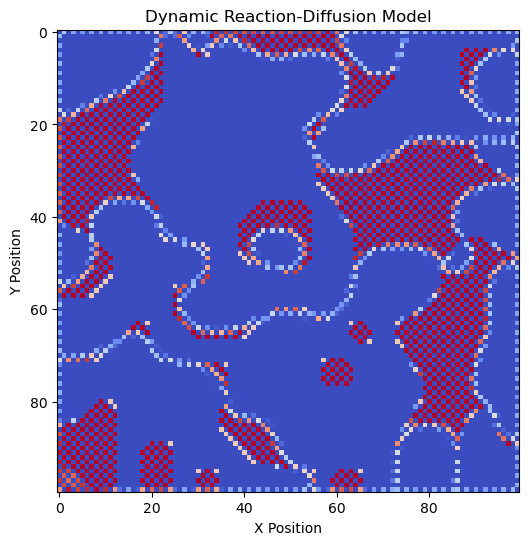

In [5]:
# Model 6: 2D Reaction-Diffusion
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from scipy.ndimage import laplace

# Parameters 
grid_size = 100  
time_steps = 200  
D_A = 0.3  
D_I = 0.4  
rho = 0.1  # Growth rate of activator
sigma = 0.1  # Strength of inhibition
alpha = 0.08  # Inhibitor production rate
beta = 0.04  # Inhibitor decay rate
random_perturbation = 0.02  # Small random noise

# Initialize activator and inhibitor fields
A = np.random.rand(grid_size, grid_size) * random_perturbation
I = np.zeros((grid_size, grid_size))

# Introduce directional growth bias
A[:, grid_size // 3] = 1  # Initial strong activator region

fig, ax = plt.subplots(figsize=(6, 6))
im = ax.imshow(A - I, cmap="coolwarm", interpolation='nearest', animated=True)
ax.set_title("Dynamic Reaction-Diffusion Model")
ax.set_xlabel("X Position")
ax.set_ylabel("Y Position")

# Update function for animation
def update(frame):
    global A, I

    lap_A = laplace(A, mode='nearest')
    lap_I = laplace(I, mode='nearest')

    dA_dt = D_A * lap_A + rho * A - sigma * I * A + np.random.randn(grid_size, grid_size) * random_perturbation
    dI_dt = D_I * lap_I + alpha * A - beta * I

    A += dA_dt
    I += dI_dt

    A = np.clip(A, 0, 1)
    I = np.clip(I, 0, 1)

    im.set_array(A - I)
    return [im]

ani = animation.FuncAnimation(fig, update, frames=time_steps, interval=50, blit=True)

from IPython.display import HTML
HTML(ani.to_jshtml())